Lab created as a demo for Chris M. (NVIDIA) - Nitu 08/06/2025
#Accuracy, Precision and Recall

Accuracy = number of correct predictions / total instances

TP = True Positive, FP = False Positive and FN = False Negative

Precision = TP / (TP + FP)

Recall = TP / (TP + FN)

F1 score = (precision.recall) / (precision + recall) = 2 TP / (2TP + FN +FP)

Different apps have differnt goals. Accuracy is widely used, but many others are possible
e.g: User satisfaction (Web Search), Amount of revenue (e-commerce), increase in patient survival rates (medical)

Its important to choose evaluation methods that match the goal of your applicaiton.

Before we start defining and using some evaluation metrics for binary classification, lets start by looking at example of why just looking at accuracy may not be enough to gain a good picture of what a classifier's doing. It'll also show us how knowing more about the types of errors a learning algorithm makes can help us get a better picture of a model's predictive performance.

First, let's consider the case where we have a binary classification task, where there are a lot of instances labeled with the negative class. But only a few instances that belong to the positive class. For example, we might see this scenario in online search or recommender systems. Where the system has to predict whether or not to display an advertisement or product suggestion. Or show a query suggestion or item on a page that's likely to be relevant given a user's query and what they clicked on in the past and so on. So those would be the positive examples. But of course there are many, many irrelevant items that are in the negative class that don't make sense to show a user. And so this is called an 'imbalanced class scenario'.

Another example might be datasets of credit card transactions. Where the vast majority of transactions are classified as normal and not fraud with a small minority of transactions that could be classified as fraudulent. These situations, which also apply to multi-class classification problems, involve datasets that have imbalanced classes. Imbalanced classes are very common in machine learning scenarios, so it's important to understand how to work with them.

In particular, let's assume that we have an e-commerce application. Where for every 1,000 randomly sampled product items, one of them is relevant to a user's need and the other 999 are not relevant. So recall that accuracy computed over a set of instances is just the number of instances where the classifier's label prediction was correct divided by the total number of instances.

# Accuracy with imbalanced classes

Accuacy =  number of correct predictions / number of total instances

Let's suppose you develop a classifier for predicting relevant e-commerce items. And after you've finished the development, you measure its accuracy on the test set to be 99.9%. At first, that might seem to be amazingly good, right? That's incredibly close to perfect. But let's compare that to a dummy classifier that always just predicts the most likely class, namely, the not relevant class. In other words, no matter what the actual instance is, the dummy classifier will always predict that an item is not relevant.

Relevant : the positive class
Not relevant : the negative class
1000 randomly selected items on average one item relevant and has R label
rest 999 are not relevant and labelled N
Let's suppose I develop a classifier for predicting relevant e-commerce items. And after I've finished the development, I measure its accuracy on the test set to be 99.9%. At first, that might seem to be amazingly good, right? That's incredibly close to perfect. But let's compare that to a dummy classifier that always just predicts the most likely class, namely, the not relevant class. In other words, no matter what the actual instance is, the dummy classifier will always predict that an item is not relevant.

#Accuracy with dummy classifier
So if we have a test set that has 1,000 items, on average 999 of them will be not relevant anyway. So our dummy classifier will correctly predict the not relevant label for all of those 999 items. And so the accuracy of the dummy classifier is also going to be 99.9%. So in reality our own classifier's performance isn't impressive at all. It's no better than just always predicting the majority class without even looking at the data.

Accuracy of (Dummy) = 999 / 1000 = 99.9%

Let's take a look at another example of classification with balanced classes on a real dataset using our notebook. I'll start here using the digits dataset, which has images of handwritten digits labeled with ten classes, representing the digits zero through nine. As we can see by letting the dataset and then computing the count of instances in each class, using numpy's bin count method. There are roughly the same number of instances in each class. So this dataset has balanced classes.

In [1]:
%matplotlib notebook
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_digits

dataset = load_digits()
X, y = dataset.data, dataset.target

In [2]:
dataset.target.shape

(1797,)

In [3]:
dataset.data.shape

(1797, 64)

In [4]:
dataset.data

array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ..., 10.,  0.,  0.],
       [ 0.,  0.,  0., ..., 16.,  9.,  0.],
       ...,
       [ 0.,  0.,  1., ...,  6.,  0.,  0.],
       [ 0.,  0.,  2., ..., 12.,  0.,  0.],
       [ 0.,  0., 10., ..., 12.,  1.,  0.]])

In [5]:
#Count number of occurrences of each value in array of non-negative ints
np.bincount(dataset.target)

array([178, 182, 177, 183, 181, 182, 181, 179, 174, 180])

In [6]:
dataset.target_names

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

The result of np.bincount are the number of occurances of the numbers in dataset.target_names.

In [7]:
for class_name, class_count in zip(dataset.target_names, np.bincount(dataset.target)):
    print(class_name, class_count)

0 178
1 182
2 177
3 183
4 181
5 182
6 181
7 179
8 174
9 180


However with this digits dataset, now what we're going to do is create a new dataset with two imbalanced classes. By labelling all digits that are not the digit 1 as the negative class with label 0, and digits that are 1 as the positive class, label 1. So what I've done here is dump the first few entries from the original labels along with the new binary label, so you can see the imbalance visually.

In [8]:
# Creating a dataset with imbalanced binary classes:
# Negative class (0) is 'not digit 1'
# Positive class (1) is 'digit 1'
y_binary_imbalanced = y.copy()
y_binary_imbalanced[y_binary_imbalanced != 1] = 0

print('Original labels:\t', y[1:30])
print('New binary labels:\t', y_binary_imbalanced[1:30])

Original labels:	 [1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9 0 1 2 3 4 5 6 7 8 9]
New binary labels:	 [1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]


Now when we use bincount, we can see that there are about 1,600 negative examples, but only 182 positive examples. So indeed, we have a dataset that is class imbalanced. Or as expected almost exactly a nine to one ratio of negative to positive examples.

In [9]:
np.bincount(y_binary_imbalanced)    # Negative class (0) is the most frequent class

array([1615,  182])

Now let's create a train test partition on this imbalance set. And then train a support vector machine classifier with these binary labels using the radial basis function as a kernel. We get the accuracy using the score method, and we can see this is just over 90%. Again at first glance, 90% accuracy for a classifier seems pretty good.

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y_binary_imbalanced, random_state=0)

# Accuracy of Support Vector Machine classifier
from sklearn.svm import SVC

svm = SVC(kernel='rbf', C=1).fit(X_train, y_train)
svm.score(X_test, y_test)

0.9955555555555555

Dummy Classifiers
(DummyClassifier is a classifier that makes predictions using simple rules, which can be useful as a baseline for comparison against actual classifiers, especially with imbalanced classes.)

However, now let's create a Dummy Classifier that correctly reflect the class imbalance to see if 90% really is that impressive. scikit-learn makes it easy to create a dummy classifier just by using the DummyClassifier class as shown here.

Dummy classifiers, again, are called that because they don't even look at the data to make a prediction. They simply use the strategy or rule of thumb that you instruct them to use, when creating them. In fact, when you create the classifier, you set the strategy argument to tell it what rule of thumb to use to make its predictions. So here, we set this to the most frequent strategy to predict the most frequent class.

The DummyClassifier here is used just like a regular classifier. So to prepare it for prediction, we call the fit method on the x_train and y_train variables that hold the training set instances and labels. Now this DummyClassifier won't actually be looking at the individual data instances of those variables. But it does use the y_train variable to determine which class in the training data is most frequent.

Finally, just like a regular classifier, we can call the predict method to make predictions on the test set. This example shows the output of the DummyClassifier's predictions. And as promised, you can see it's always predicting 0 or the negative class for every instance in the test set.

In [11]:
from sklearn.dummy import DummyClassifier

# Negative class (0) is most frequent
dummy_majority = DummyClassifier(strategy = 'most_frequent').fit(X_train, y_train)
# Therefore the dummy 'most_frequent' classifier always predicts class 0
y_dummy_predictions = dummy_majority.predict(X_test)

y_dummy_predictions

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

Now we can call the usual score method to get the accuracy of the DummyClassifier's constant negative prediction. And we can see it's also 90%, the same as our earlier support vector machine classifier with radio bases function kernel. So that support vector classifier was actually performing only very slightly better than the DummyClassifier.

In [12]:
dummy_majority.score(X_test, y_test)

0.9044444444444445

The dummy classifier provides what is called a null accuracy baseline. That is the accuracy that can be achieved by always picking the most frequent class.

You should not use a dummy classifier for real classification problems, but it does provide a useful sanity check in point of comparison. There are other types of dummy classifiers that provide null base lines corresponding to other choices of the strategy parameter as shown here.

# Dummy classifiers completely ignore the input data
-Dummy classifiers serve as a sanity check on your classfier performance
-They provide a null metric(null accuracy) baseline
-Dummy classifiers should not be used for real problems

jupyter
most_frequent is the strategy we've just seen that always predicts the most_frequent label. The stratified strategy, unlike the constant most_frequent prediction is a random prediction that's based on the class distributions. For example, if the positive class occurs 90% of the time in the training set. Then the stratified DummyClassifier will output the positive class label with 90% probability. Otherwise, it will output the negative class label.

# Dummy classifiers completely ignore the input data
Some commonly used settings for the strategy parameter for dummy classifier in scikit-learn:
- most frequent : predicts the most frequent lable in the training set
- stratified: random predictions based on the training set class distribution
- uniform: generates predictions uniformly at a random
- constant: alway s predicts a constant label provided by the user
  A major motivation of this method is F1-scoring, when the positive class is in the minority

  So what does it mean if we discover that our classifier has close to the DummyClassifier's performance? While typically it means that the features in our model may be ineffective, or erroneously computed or missing for some reason, it could also be caused by a poor choice of kernel or hyperparameter in the model.

# What if my classifier accuracy is close to the accuracy baseline?
This could be a sign of:
- In effective, erroneous or missing features
- poor choice of kernel or hyperparameter
- large class imbalance

For example, if we change the support vector classifier's kernel parameter to linear from rbf. And recompute the accuracy on this retrain classifier, we can see that this leads to much better performance of almost 98% compared to the most frequently class based line of 90%.

In [13]:
svm = SVC(kernel='linear', C=1).fit(X_train, y_train)
svm.score(X_test, y_test)

0.9777777777777777

Finally, if you have accuracy that is close to that of a dummy classifier, it could be because there is indeed a large class imbalance. And the accuracy gains produced by the classifier on the test set simply applied too few examples to produce a significant gain. In general, for imbalanced classification problems, you should use metrics other than accuracy. We'll look at one shortly called AUC, which is short for area under the curve.

DummyRegressors, as you might guess, are the counterpart to DummyClassifiers for regression. And they serve a similar role as a null outcome baseline and sanity check for regression models. Since regression models have continuous value prediction outputs. The strategy parameter for DummyRegressors gives you a choice of function that you can apply to the distribution of target values found in the training set. You can ask for the mean or median value of the training set targets. The value corresponding to the quantile that you provide or a custom constant value.
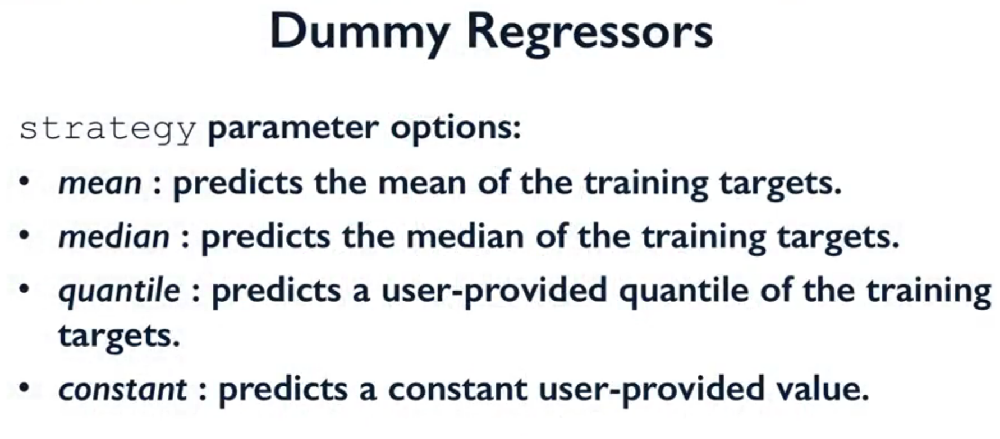


# Confusion matrices
Now let's look more carefully at the different types of outcomes we might see using a binary classifier. This will give us some insight into why using just accuracy doesn't give a complete picture of the classifier's performance. And will motivate our definition and exploration of additional evaluation metrics.

With a positive and negative class, there are four possible outcomes that we can break into two cases corresponding to the first and second row of this matrix. If the true label for an instance is negative, the classifier can predict either negative, which is correct, and call the true negative. Or it can erroneously predict positive, which is an error and called a false positive.

If the true label for an instance is positive, the classifier can predict either negative, which is an error and called a false negative. Or it can predict positive, which is correct and that's called a true positive. So maybe a quick way to remember this is that the first word in these matrix cells is false, if it's a a classifier error, or true if it's a classifier success. The second word is negative if the true label is negative and positive if the true label is positive.

Another name for a false positive that you might know from statistics is a type one error. And another name for a false negative is a type two error. We're going to use these two-letter combinations, TN, FN, FP, and TP, as variable names, when defining some new evaluation metrics shortly. We'll also use capital N here to denote the total number of instances, of the sum of all the values in the matrix, the number of data points we're looking at.
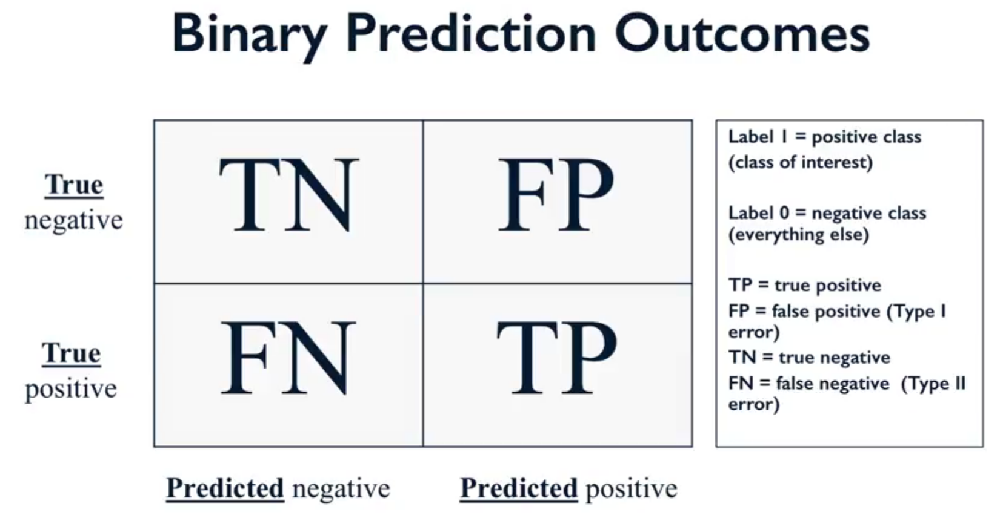

This matrix of all combinations of predicted label and true label is called a confusion matrix. We can take any classifier prediction on a data instance and associate it with one of these matrix cells, depending on the true label of the instance and the classifier's predicted label. This also applies to multi-class classification, in addition to the special case of binary classification I've shown here. In the multi-class case with k classes, we simply have a k by k matrix instead of a two by two matrix. Scikit-learn makes it easy to compute a confusion matrix for your classifier.
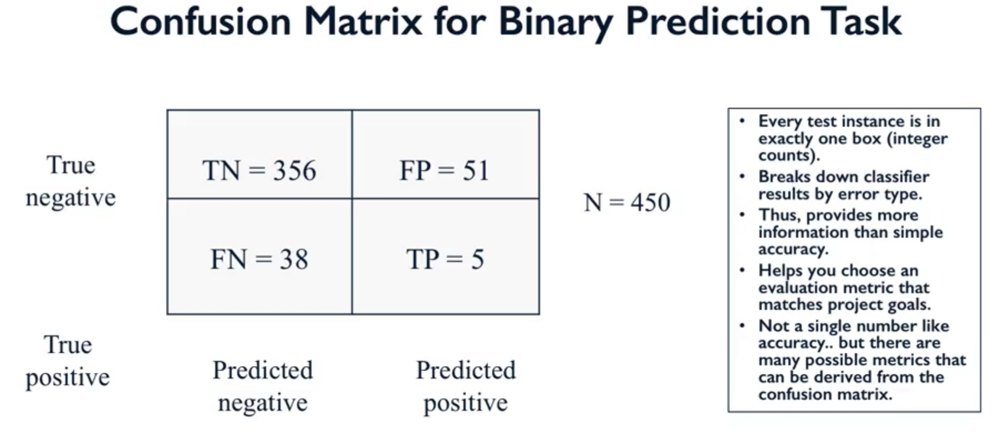

Let's take a look at the notebook. Here, we import the confusion matrix class from sklearn.metrics. We're going to use the same training set from the digits data set with the binary imbalance labels that we created earlier.

To get the confusion matrix, we simply pass the y_test set of predicted labels and the y predicted set of predicted labels and then print the output. The order of the cells of the little matrix output here is the same as the one I just showed on the slide.

True negative (TN) and false negative (FN) are in the first column, and true positive (TP) and false positive (FP) are in the second column. In particular, the successful predictions of the classifier are on the diagonal where the true class matches the predicted class. The cells off the diagonal represent errors of different types.

Here, we compute the confusion matrices for different choices of classifier in the problem so we can see how they shift slightly with different choices of model. gives us some insight into the nature of successes and failures observed for each type of classifier.

So first, we'll apply the most frequent class DummyClassifier we saw earlier. What we can see here is that the right column, that represent cases where the classifier predicted the positive class, is all zero. Which makes sense for this dummy classifier because it's always predicting the negative class, the most frequent one. We see that 407 instances are true negatives, and there are 43 errors that are false negatives.

# Binary (two class) confusion matrix

In [14]:
from sklearn.metrics import confusion_matrix

# Negative class (0) is most frequent
dummy_majority = DummyClassifier(strategy = 'most_frequent').fit(X_train, y_train)
y_majority_predicted = dummy_majority.predict(X_test)
confusion = confusion_matrix(y_test, y_majority_predicted)

print('Most frequent class (dummy classifier)\n', confusion)

Most frequent class (dummy classifier)
 [[407   0]
 [ 43   0]]


Here we apply the stratified DummyClassifier that gives random output in proportion to the ratio labels in the training set. Now the right column is no longer all zero because this DummyClassifier does predict occasionally the positive class. If we add the numbers in the right column, we see that 44 plus 2 equals 46 times the number of times the classifier predicted the positive class. Of those times, in 2 cases, the lower right diagonal, this was a true positive.

In [15]:
# produces random predictions w/ same class proportion as training set
dummy_classprop = DummyClassifier(strategy='stratified').fit(X_train, y_train)
y_classprop_predicted = dummy_classprop.predict(X_test)
confusion = confusion_matrix(y_test, y_classprop_predicted)

print('Random class-proportional prediction (dummy classifier)\n', confusion)

Random class-proportional prediction (dummy classifier)
 [[359  48]
 [ 37   6]]


In the next case, we'll apply a support vector classifier with linear kernel and seed parameter equal to one. We note that looking along the diagonal compared to the stratified dummy classifier above, which had a total of 363 plus 2, or 365 correct predictions. The support vector classifier has a total of 402 plus 38, which is 440 correct predictions on the same data set.

In [16]:
svm = SVC(kernel='linear', C=1).fit(X_train, y_train)
svm_predicted = svm.predict(X_test)
confusion = confusion_matrix(y_test, svm_predicted)

print('Support vector machine classifier (linear kernel, C=1)\n', confusion)

Support vector machine classifier (linear kernel, C=1)
 [[402   5]
 [  5  38]]


Likewise, we can apply a logistic regression classifier, and that obtains similar results to the support vector classifier.

In [17]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression().fit(X_train, y_train)
lr_predicted = lr.predict(X_test)
confusion = confusion_matrix(y_test, lr_predicted)

print('Logistic regression classifier (default settings)\n', confusion)

Logistic regression classifier (default settings)
 [[401   6]
 [  8  35]]


/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


And finally, we can apply a decision tree classifier, and look at the confusion matrix that results from that. One thing we notice is, that unlike the support vector or logistic regression classifier, which had balanced numbers of false negatives and false positives. The decision tree makes more than twice as many false negative errors, 17 of them actually, as false positive errors, of which there are 7. Now that we've seen how a confusion matrix can give us a little more information about the types of errors a classifier makes, we're ready to move ahead and and define some new types of evaluation metrics that use information from the computing matrix to give different perspectives on classifier performance.

In [18]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(max_depth=2).fit(X_train, y_train)
tree_predicted = dt.predict(X_test)
confusion = confusion_matrix(y_test, tree_predicted)

print('Decision tree classifier (max_depth = 2)\n', confusion)

Decision tree classifier (max_depth = 2)
 [[400   7]
 [ 17  26]]


# Evaluation metrics for binary classification
So, let's go back to the matrix of possible binary classification outcomes. This time filled out with the actual counts from the notebooks decision tree output. Remember our original motivation for creating this matrix was to go beyond a single number accuracy, to get more insight into the different types of prediction successes and failures of a given classifier. Now we have these four numbers that we can examine and compare manually.
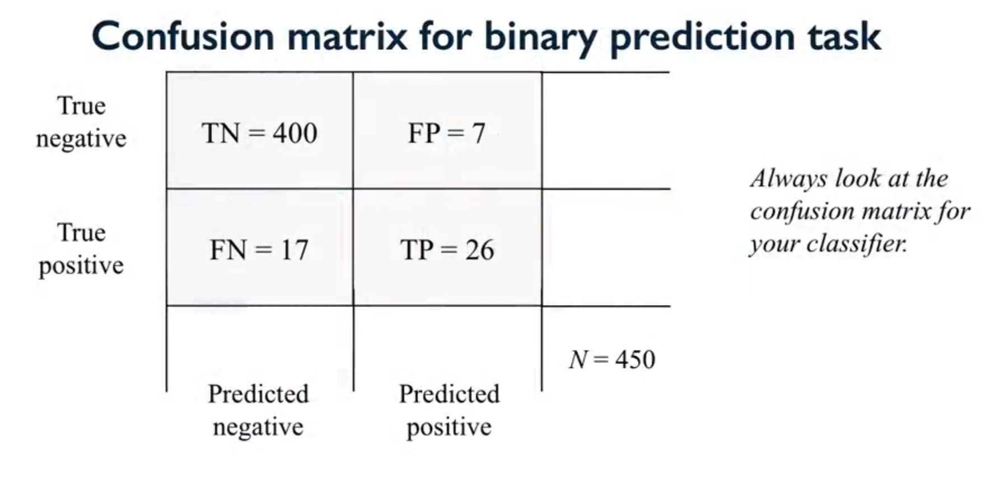

Let's look at this classification result visually to help us connect these four numbers to a classifier's performance. What I've done here is plot the data instances by using two specific feature values out of the total 64 feature values that make up each instance in the digits dataset. The black points here are the instances with true class positive namely the digit one and the white points have true class negative, that is, there are all the other digits except for one. The black line shows a hypothetical linear classifier's decision boundary for which any instance to the left of the decision boundary is predicted to be in the positive class and everything to the right of the decision boundary is predicted to be in the negative class. The true positive points are those black points in the positive prediction region and false positives are those white points in the positive prediction region. Likewise, true negatives are the white points in the negative prediction region and false negatives are black points in the negative prediction region.
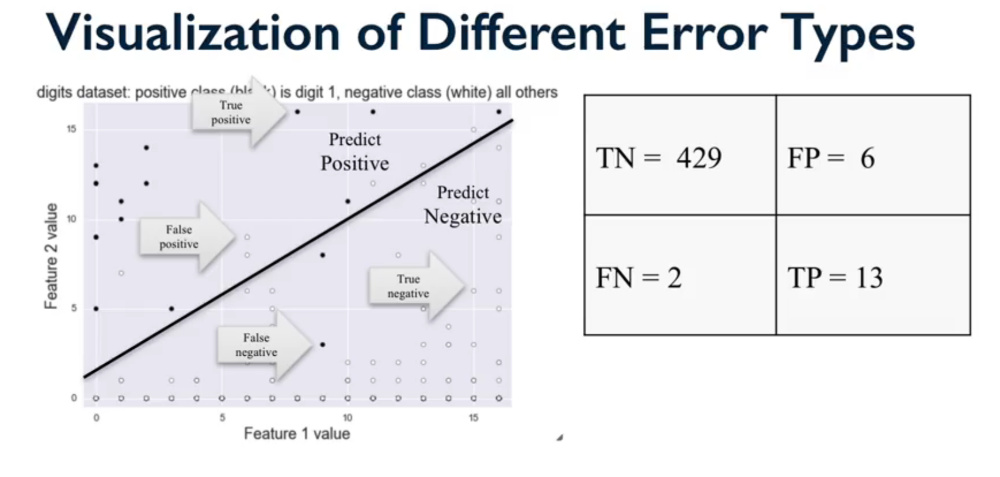

We've already seen one metric that can be derived from the confusion matrix counts namely accuracy (accuraccy measures how well (or correclty) the classifier is predicting all the instances, Tpossitive + Tnegative) . The successful predictions of the classifier, the ones where the predicted class matches the true class are along the diagonal of the confusion matrix. So, if we add up all the accounts along the diagonal, that will give us the total number of correct predictions across all classes, and dividing this sum by the total number of instances gives us accuracy. But, let's look at some other evaluation metrics we can compute from these four numbers.

Note: The accurracy paradox for predictive analytics states that predictive models with a given level of accuracy may have a greater power than models with higher accuracy. It maybe better to avoid the accuracy metric in favour of other metrics such precission and recall. For example, in the case of fraud detection, when the accuracy in a model is 98% (TN=9700, TP=100, FP=150, FN=50) can be improved the score to 98.5% (TN=9850, TP=0, FP=0, FN=150), but that model will always predict no fraud (always predict negative) which will be a bad prduct, since fraus will be undetected
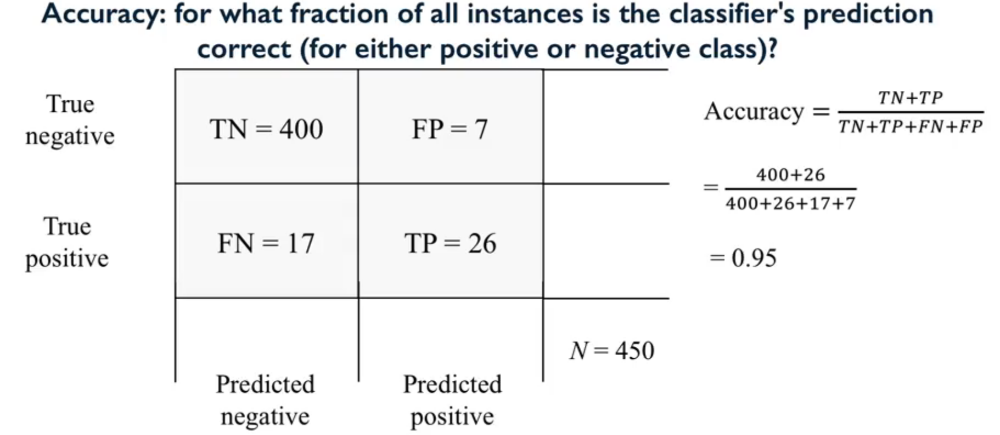

Well, a very simple related number that's sometimes used is Classification error, which is the sum of the counts off the diagonal namely all of the errors divided by total instance count, and numerically, this is equivalent to just one minus the accuracy (accurracy complement).
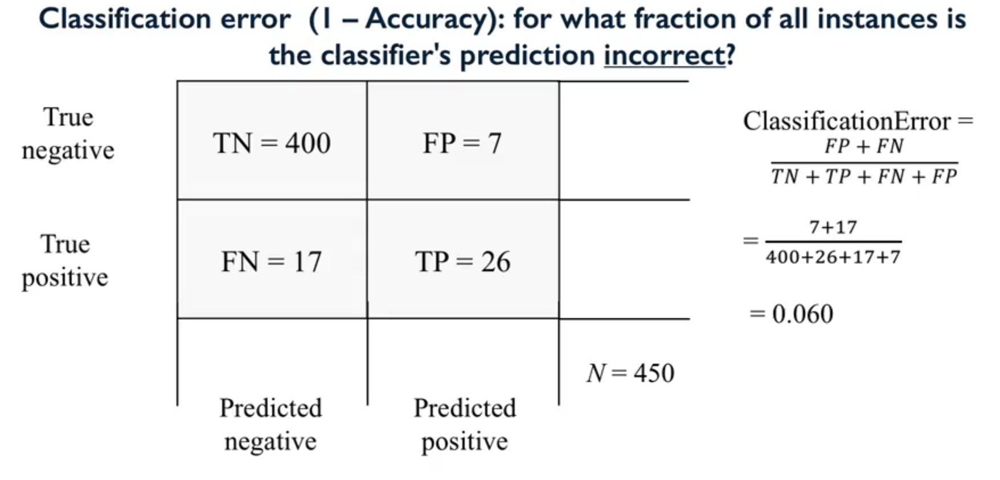

Now, for a more interesting example, let's suppose, going back to our medical tumor detecting classifier that we wanted an evaluation metric that would give higher scores to classifiers that not only achieved the high number of true positives but also avoided false negatives. That is, that rarely failed to detect a true cancerous tumor. Recall (Sensitivity-fraction of all positive intances that are correclty classified as positive), also known as the true positive rate, sensitivity or probability of detection is such an evaluation metric and it's obtained by dividing the number of true positives (TP) by the sum of true positives and false negatives (TP + FN)—(Recall=TP/# actual possitive values). You can see from this formula that there are two ways to get a larger recall number. First, by either increasing the number of true positives or by reducing the number of false negatives. Since this will make the denominator smaller. In this example there are 26 true positives and 17 false negatives which gives a recall of 0.6.
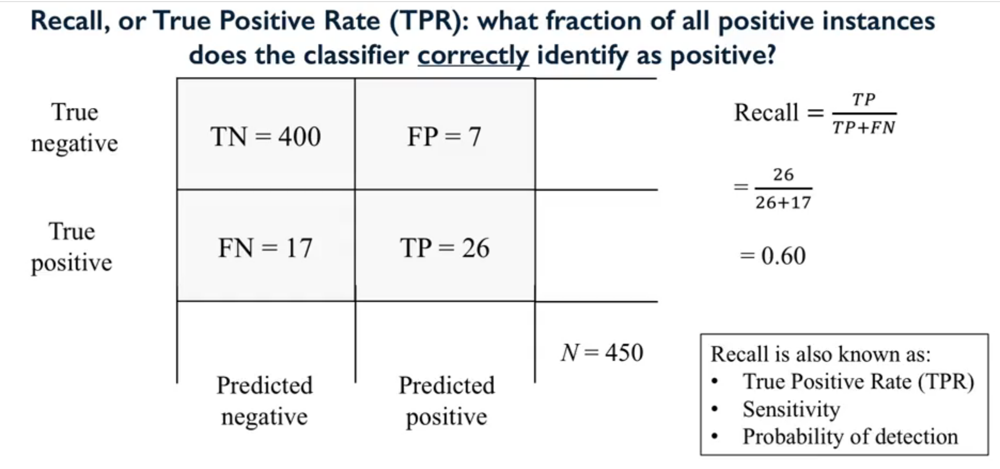

Now suppose that we have a machine learning task, where it's really important to avoid false positives. In other words, we're fine with cases where not all true positive instances are detected but when the classifier does predict the positive class, we want to be very confident that it's correct. A lot of customer facing prediction problems are like this, for example, predicting when to show a user a query suggestion in a web search interface might be one such scenario. Users will often remember the failures of a machine learning prediction even when the majority of predictions are successes. So, precision or also refered as positive predictive value (PPV) (the ratio of correct positive examples or number of actual possitive examples. Measuring how well our model is predicting the positive examples) is an evaluation metric that reflects the situation and is obtained by dividing the number of true positives(TP) by the sum of true positives and false positives (TP+FP). So to increase precision, we must either increase the number of true positives the classifier predicts or reduce the number of errors where the classifier incorrectly predicts that a negative instance is in the positive class (FP). Here, the classifier has made seven false positive errors and so the precision is 0.79. (preccission= TP/ #predicted possitive examples)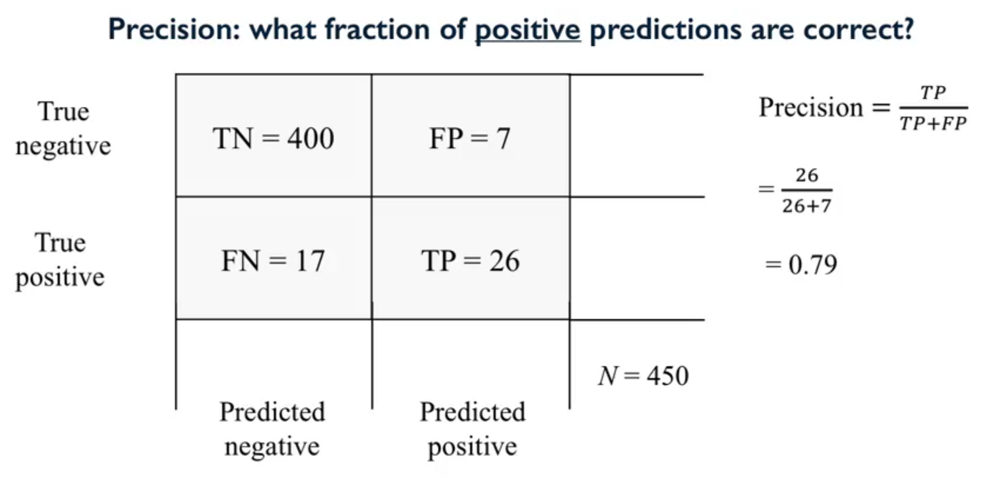

Another related evaluation metric that will be useful is called the false positive rate, also known as specificity. This gives the fraction of all negative instances that the classifier incorrectly identifies as positive (Specificity=TN/# Actual neagative rate(TN+FP). Here, we have seven false positives, which out of a total of 407 negative instances, gives a false positive rate of 0.02.
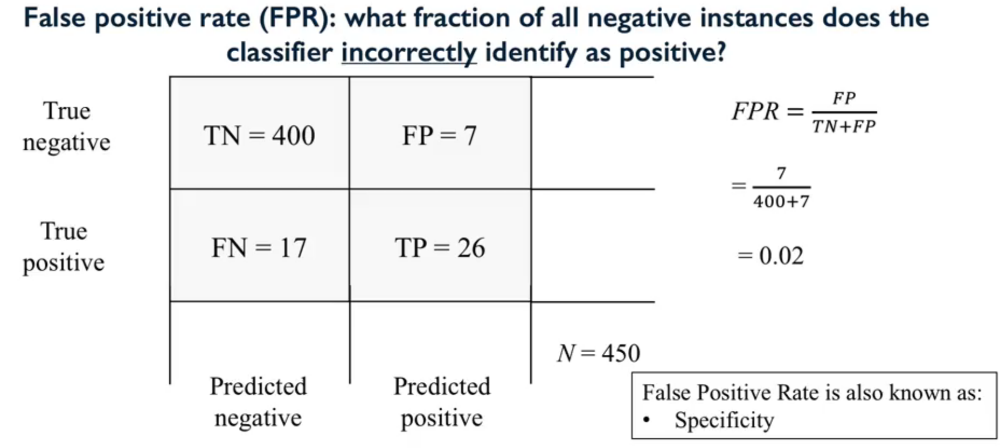

Going back to our classifier visualization, let's look at how precision and recall(sensitivity) can be interpreted. The numbers that are in the confusion matrix here are derived from this classification scenario. We can see that a precision of 0.6 means that about 68 percent of the points in the positive prediction region to the left of the decision boundary or 13 out of the 19 instances are correctly labeled as positive. A recall of 0.87 means, that of all true positive instances, so all black points in the figure, the positive prediction region has 'found about 87 percent of them' or 13 out of 15.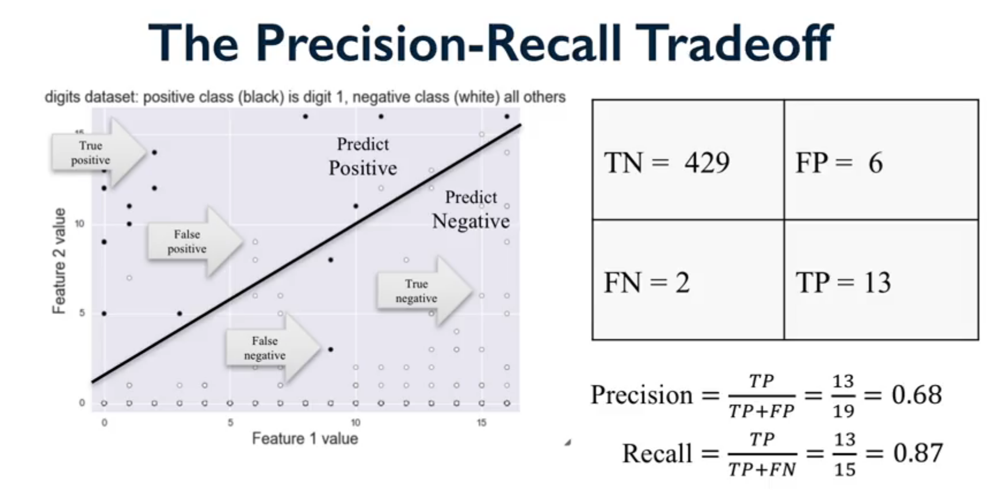

If we wanted a classifier that was oriented towards higher levels of precision (increase the number of correctly classified positive predicted values) like in the search engine query suggestion task, we might want a decision boundary instead that look like this. Now, all the points in the positive prediction region seven out of seven are true positives, giving us a perfect precision of 1.0. Now, this comes at a cost because out of the 15 total positive instances eight of them are now false negatives, in other words, they're incorrectly predicted as being negative. And so, recall drops to 7 divided by 15 or 0.47 (of all the true postive instances, we just found 7 out of 15).

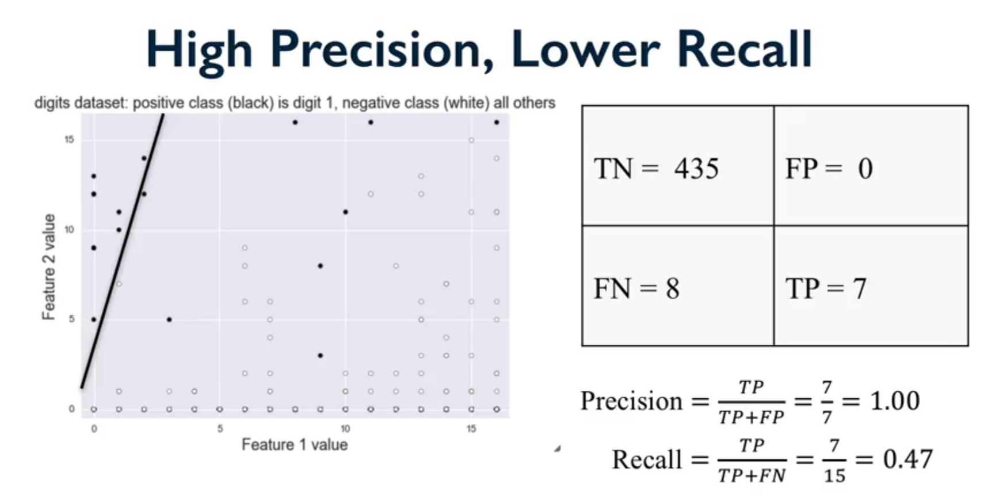

On the other hand, if our classification task is like the tumor detection example, we want to minimize false negatives and obtain high recall (increase the number of positive instances identified by the classifier as positive). In which case, we would want the classifier's decision boundary to look more like this. Now, all 15 positive instances have been correctly predicted as being in the positive class, which means these tumors have all been detected. However, this also comes with a cost since the number of false positives, things that the detector triggers as possible tumors for example that are actually not, has gone up. So, recall is a perfect 1.0 score but the precision has dropped to 15 out of 42 or 0.36.
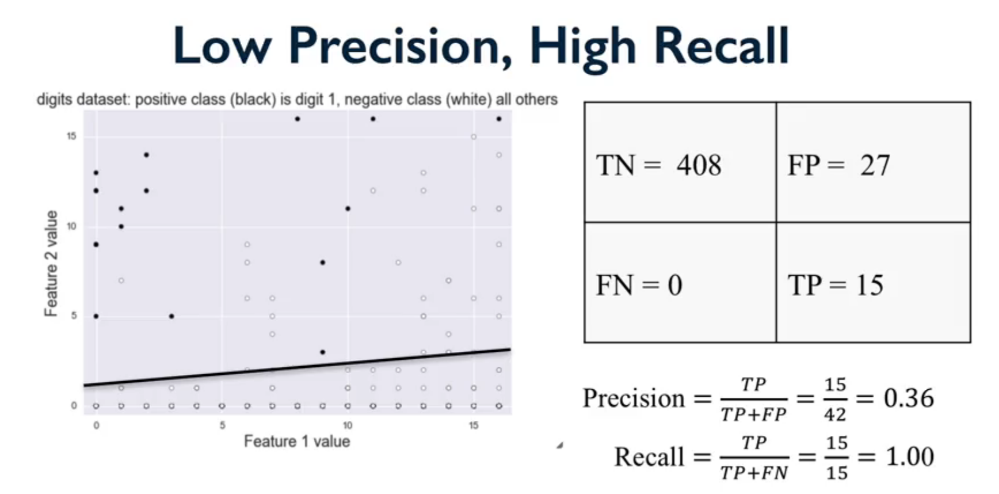

These examples illustrate a classic trade-off that often appears in machine learning applications. Namely, that you can often increase the precision of a classifier but the downside is that you may reduce recall, or you could increase the recall of a classifier at the cost of reducing precision.

Recall oriented machine learning tasks include medical and legal applications, where the consequences of not correctly identifying a positive example can be high. Often in these scenarios human experts are deployed to help filter out the false positives that almost inevitably increase with high recall applications. Many customer facing machine learning tasks, as I just mentioned, are often precision oriented since here the consequences of false positives can be high, for example, hurting the customer's experience on a website by providing incorrect or unhelpful information. Examples include, search engine ranking and classifying documents to annotate them with topic tags.
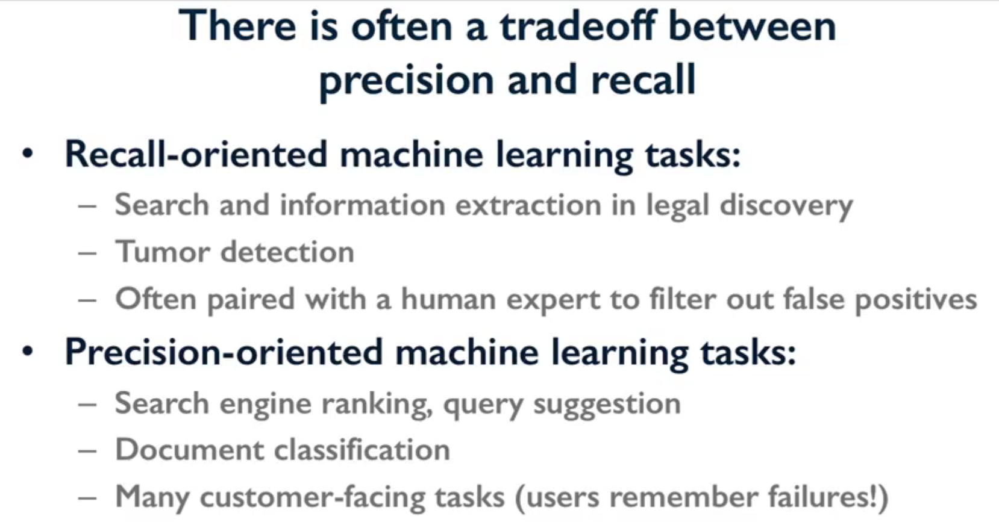

When evaluating classifiers, it's often convenient to compute a quantity known as an F1 score, that combines precision and recall into a single number. Mathematically, this is based on the harmonic mean of precision and recall using this formula. After a little bit of algebra, we can rewrite the F1 score in terms of the quantities that we saw in the confusion matrix: true positives, false negatives and false positives.

This F1 score is a special case of a more general evaluation metric known as an F score that introduces a parameter beta. By adjusting beta we can control how much emphasis an evaluation is given to precision versus recall. For example, if we have precision oriented users, we might say a beta equal to 0.5, since we want false positives (FP) to hurt performance more than false negatives. For recall oriented situations, we might set beta to a number larger than one, say two, to emphasize that false negatives (FN) should hurt performance more than false positives. The setting of beta equals one corresponds to the F1 score special case that we just saw that weights precision and recall equally. (F is a score with different weight of precission and recall)
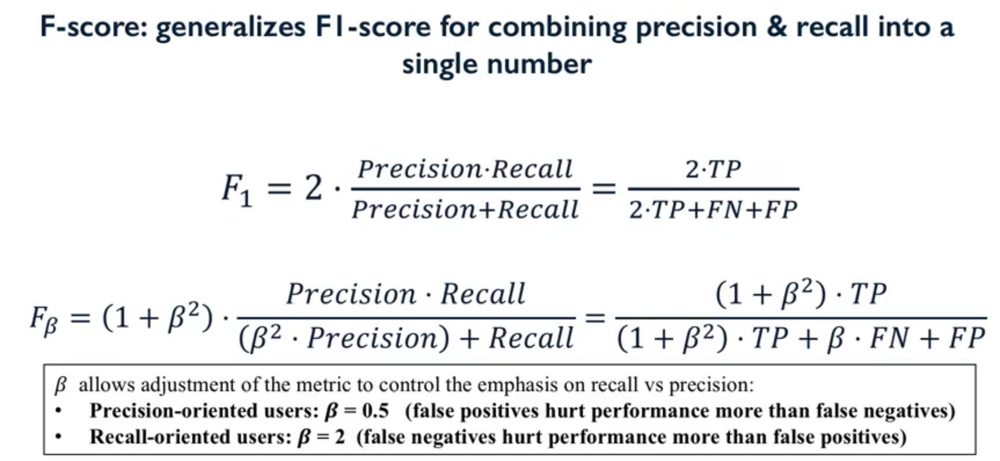

Definitions of statistical measures of the performance of a binary classification test, also kjnow in statistics as classificaition function

Let's take a look now at how we can compute these evaluation metrics in Python using scikit-learn. Scikit-learn metrics provides functions for computing accuracy, precision, recall, and F1 score as shown here in the notebook. The input to these functions is the same. The first argument here, y_test, is the array of true labels of the test set data instances and the second argument is the array of predicted labels for the test set data instances. Here we're using a variable called tree_predicted which are the predicted labels using the decision tree classifier in the previous notebook step. It's often useful when analyzing classifier performance to compute all of these metrics at once.

In [19]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
# Accuracy = TP + TN / (TP + TN + FP + FN)
# Precision = TP / (TP + FP)
# Recall = TP / (TP + FN)  Also known as sensitivity, or True Positive Rate
# F1 = 2 * Precision * Recall / (Precision + Recall)
print('Accuracy: {:.2f}'.format(accuracy_score(y_test, tree_predicted)))
print('Precision: {:.2f}'.format(precision_score(y_test, tree_predicted)))
print('Recall: {:.2f}'.format(recall_score(y_test, tree_predicted)))
print('F1: {:.2f}'.format(f1_score(y_test, tree_predicted)))

Accuracy: 0.95
Precision: 0.79
Recall: 0.60
F1: 0.68


So, sklearn metrics provides a handy classification report function. Like the previous core functions, classification report takes the true and predicted labels as the first two required arguments. It also takes some optional arguments that control the format of the output. Here, we use the target names option to label the classes in the output table. You can take a look at the scikit-learn documentation for more information on the other output options.

In [20]:
# Combined report with all above metrics
from sklearn.metrics import classification_report

print(classification_report(y_test, tree_predicted, target_names=['not 1', '1']))

              precision    recall  f1-score   support

       not 1       0.96      0.98      0.97       407
           1       0.79      0.60      0.68        43

    accuracy                           0.95       450
   macro avg       0.87      0.79      0.83       450
weighted avg       0.94      0.95      0.94       450



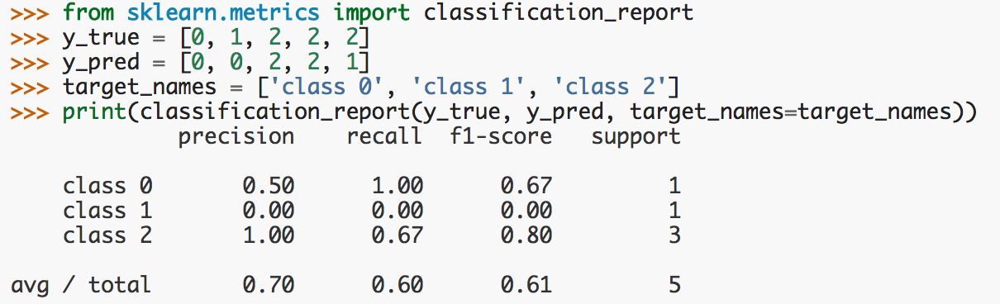

The f1-score gives the harmonic mean of precision and recall. The scores corresponding to every class will tell the accuracy of the classifier in classifying the data points in that particular class compared to all other classes.

The support is the number of samples of the true response that lie in that class, or the support is the number of occurrences of each class in y_true.

The links it can be found the documentation on both measures in the sklearn documentation: [Support](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.precision_recall_fscore_support.html), [F1-score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html)

The last line gives a weighted average of precision, recall and f1-score where the weights are the support values. so for precision the avg is

 (0.50  X 1  + 0.0 X 1  + 1.0. X 3) /5 = 0.70

The total is just for total support which is 5 here.

Here we show classification reports for four different classifiers on the binary digit classification problem. The first set of results is from the dummy classifier and we can see that as expected both precision and recall for the positive class are very low since the dummy classifier is simply guessing randomly with low probability of predicting that positive class for the positive instances.

In [21]:
print('Random class-proportional (dummy)\n',
      classification_report(y_test, y_classprop_predicted, target_names=['not 1', '1']))
print('SVM\n',
      classification_report(y_test, svm_predicted, target_names = ['not 1', '1']))
print('Logistic regression\n',
      classification_report(y_test, lr_predicted, target_names = ['not 1', '1']))
print('Decision tree\n',
      classification_report(y_test, tree_predicted, target_names = ['not 1', '1']))

Random class-proportional (dummy)
               precision    recall  f1-score   support

       not 1       0.91      0.88      0.89       407
           1       0.11      0.14      0.12        43

    accuracy                           0.81       450
   macro avg       0.51      0.51      0.51       450
weighted avg       0.83      0.81      0.82       450

SVM
               precision    recall  f1-score   support

       not 1       0.99      0.99      0.99       407
           1       0.88      0.88      0.88        43

    accuracy                           0.98       450
   macro avg       0.94      0.94      0.94       450
weighted avg       0.98      0.98      0.98       450

Logistic regression
               precision    recall  f1-score   support

       not 1       0.98      0.99      0.98       407
           1       0.85      0.81      0.83        43

    accuracy                           0.97       450
   macro avg       0.92      0.90      0.91       450
weighted avg 